In [2]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [3]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [11]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        img = img.permute(1, 2, 0).contiguous()
        self.pixels = img.view(-1, img.shape[-1])
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0: raise IndexError

        return self.coords, self.pixels

In [12]:
def get_cameraman_tensor(sidelength):
    img = Image.open("starry_night_512.png")
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [13]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

# img_siren = Siren(in_features=2, out_features=1, hidden_features=256,
#                   hidden_layers=3, outermost_linear=True)
# img_siren.cuda()

/opt/conda/lib/python3.11/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [14]:
class TanhLayer(nn.Module):
    def __init__(self, in_features, out_features, bias=True, is_first=False):
        """
        is_first kept for API compatibility; we don't need special init.
        """
        super().__init__()
        self.is_first = is_first
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()

    def init_weights(self):
        # Xavier is optimal for tanh
        with torch.no_grad():
            nn.init.xavier_uniform_(self.linear.weight)
            if self.linear.bias is not None:
                self.linear.bias.fill_(0.0)

    def forward(self, input):
        return torch.tanh(self.linear(input))

    def forward_with_intermediate(self, input):
        intermed = self.linear(input)
        return torch.tanh(intermed), intermed


In [15]:
class TanhNet(nn.Module):
    def __init__(self, in_features, hidden_features, hidden_layers,
                 out_features, outermost_linear=False):
        super().__init__()

        net = []

        # First layer
        net.append(TanhLayer(in_features, hidden_features, is_first=True))

        # Hidden layers
        for _ in range(hidden_layers):
            net.append(TanhLayer(hidden_features, hidden_features))

        # Output layer
        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            with torch.no_grad():
                nn.init.xavier_uniform_(final_linear.weight)
                if final_linear.bias is not None:
                    final_linear.bias.fill_(0.0)
            net.append(final_linear)
        else:
            net.append(TanhLayer(hidden_features, out_features))

        self.net = nn.Sequential(*net)

    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        activations = OrderedDict()

        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x
        activation_count = 0

        for layer in self.net:
            if isinstance(layer, TanhLayer):
                x, intermed = layer.forward_with_intermediate(x)
                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()
                activations[f"TanhLayer_{activation_count}"] = intermed
                activation_count += 1
            else:
                x = layer(x)
                if retain_grad:
                    x.retain_grad()
            activations[f"Layer_{activation_count}"] = x
            activation_count += 1

        return activations


In [16]:
img_tanh = TanhNet(
    in_features=2,
    hidden_features=256,
    hidden_layers=2,
    out_features=1,
    outermost_linear=True
).cuda()


Step 0, Total loss 0.201380


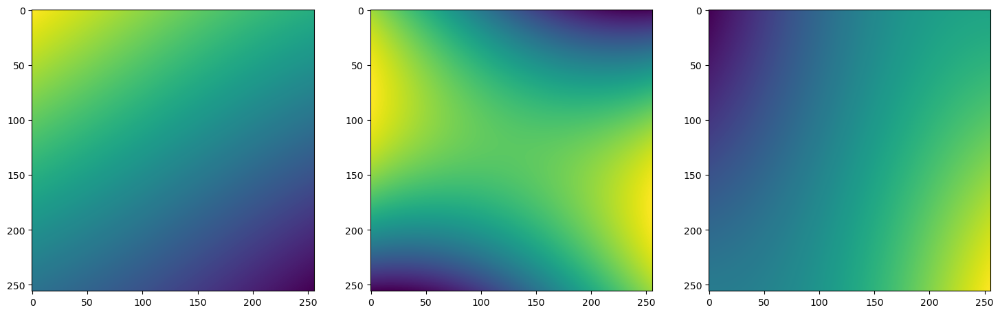

Step 10, Total loss 0.154964


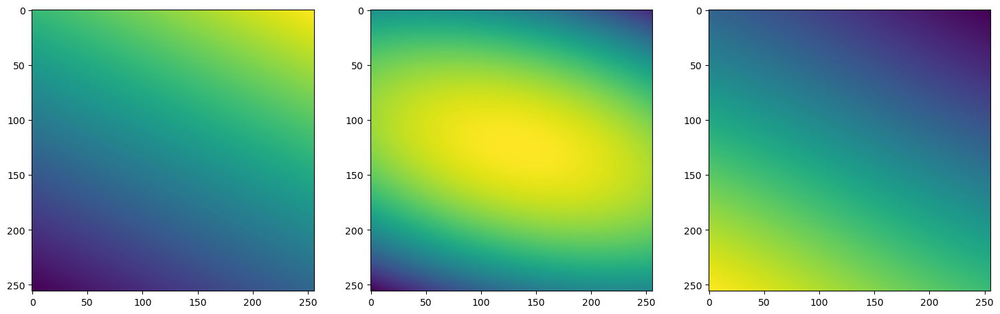

Step 20, Total loss 0.130633


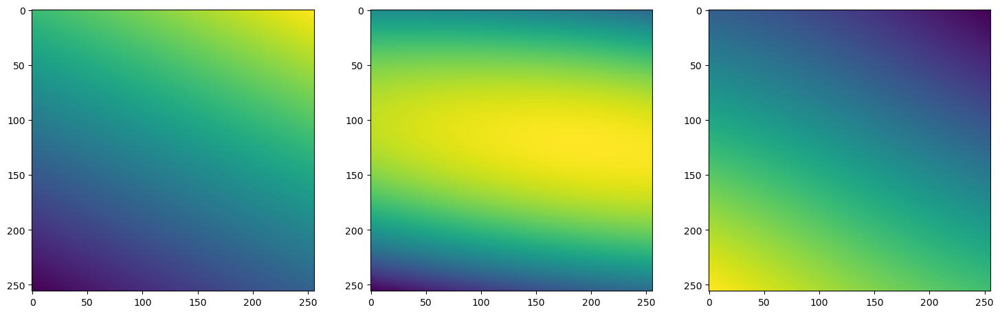

Step 30, Total loss 0.114128


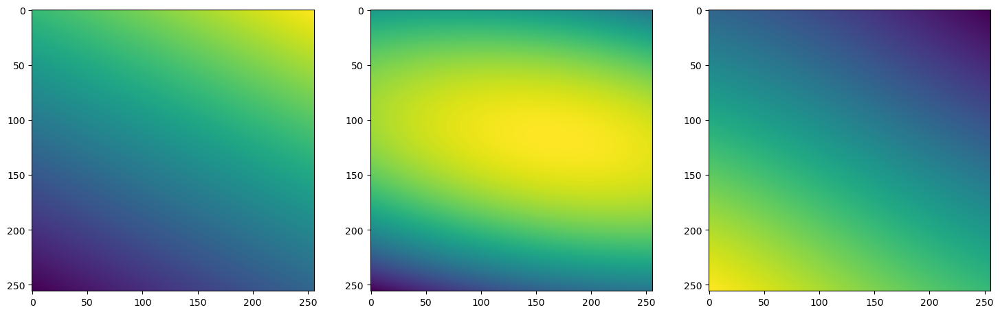

Step 40, Total loss 0.105881


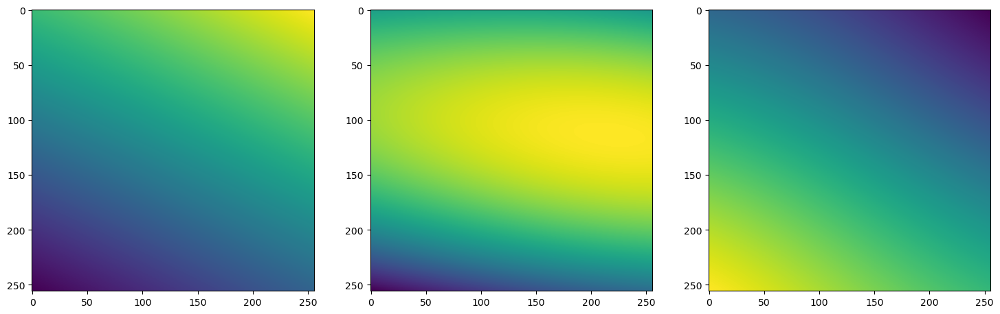

Step 50, Total loss 0.104755


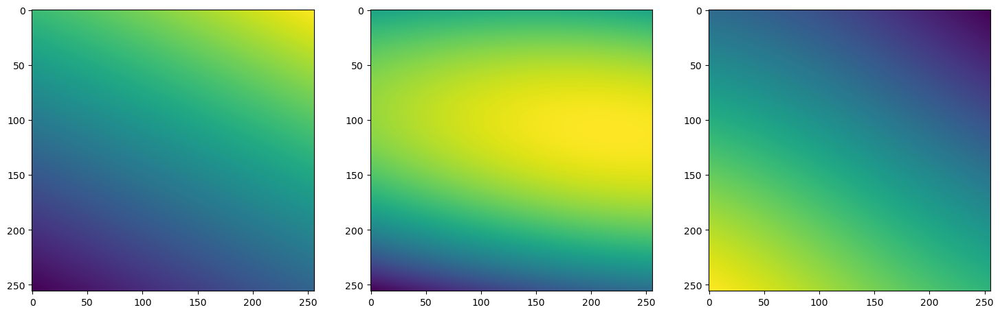

Step 60, Total loss 0.105063


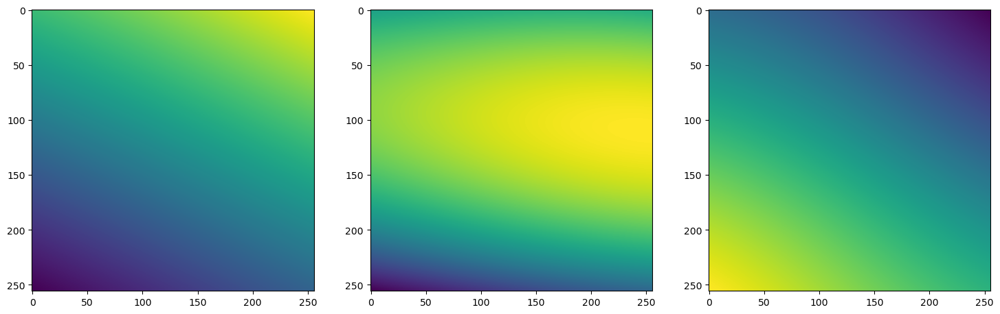

Step 70, Total loss 0.104703


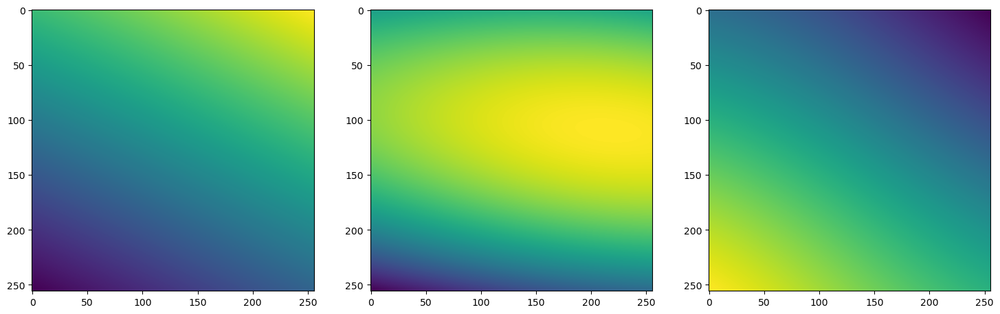

Step 80, Total loss 0.104620


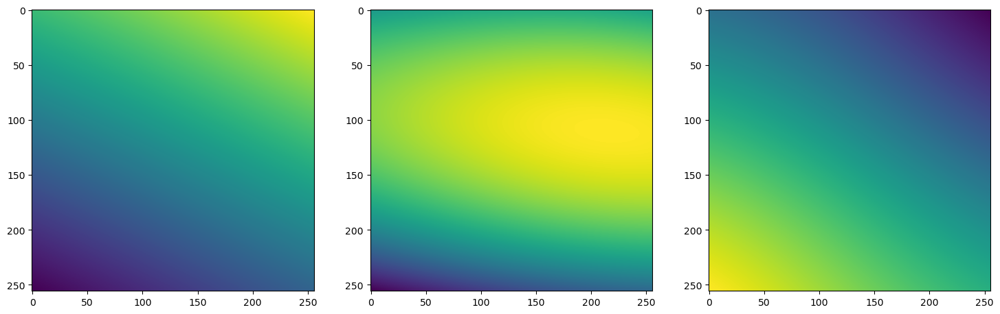

Step 90, Total loss 0.104629


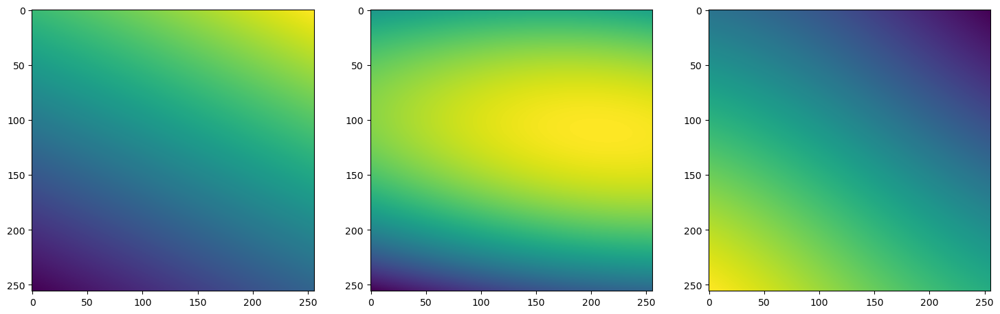

Step 100, Total loss 0.104607


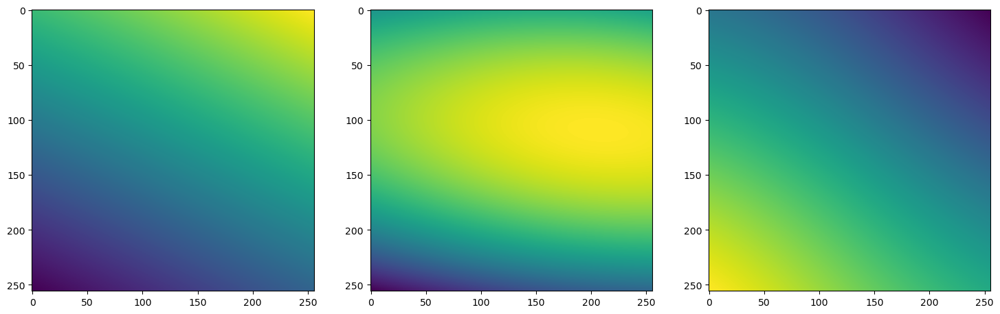

Step 110, Total loss 0.104599


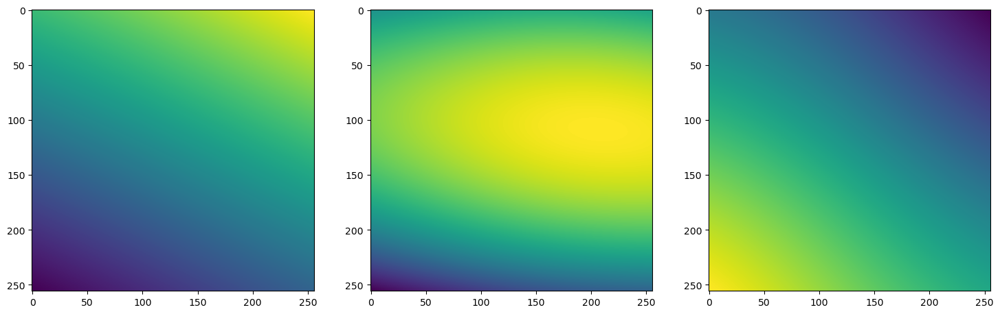

Step 120, Total loss 0.104594


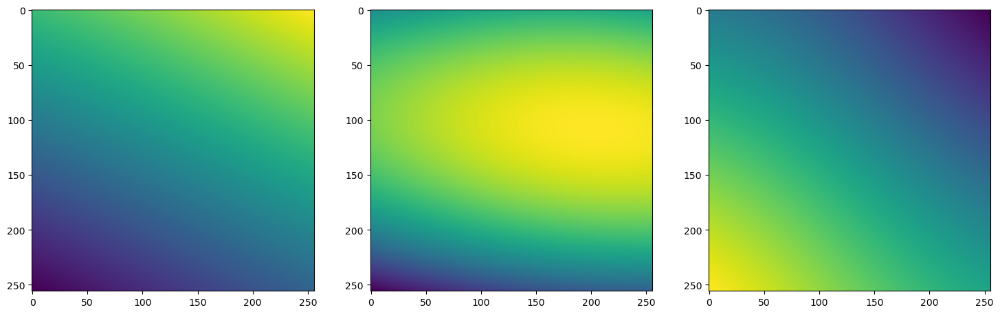

Step 130, Total loss 0.104587


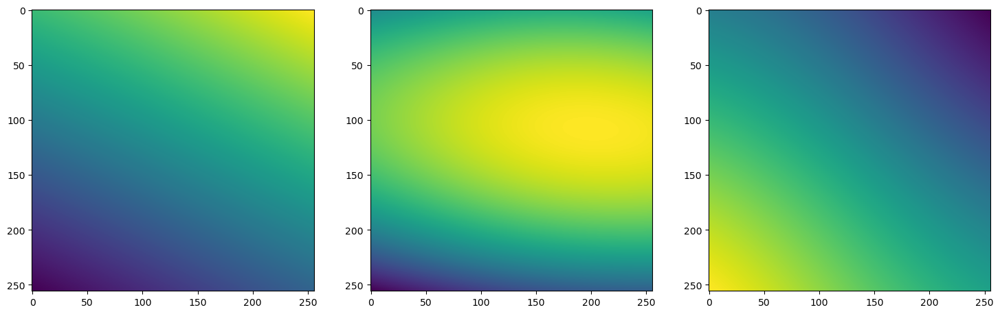

Step 140, Total loss 0.104581


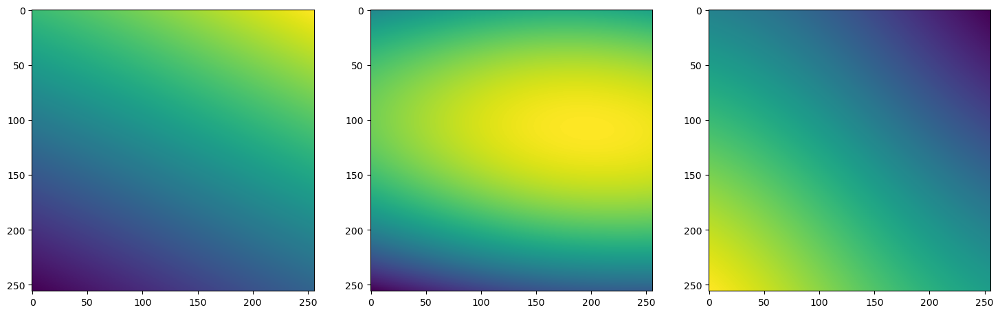

Step 150, Total loss 0.104575


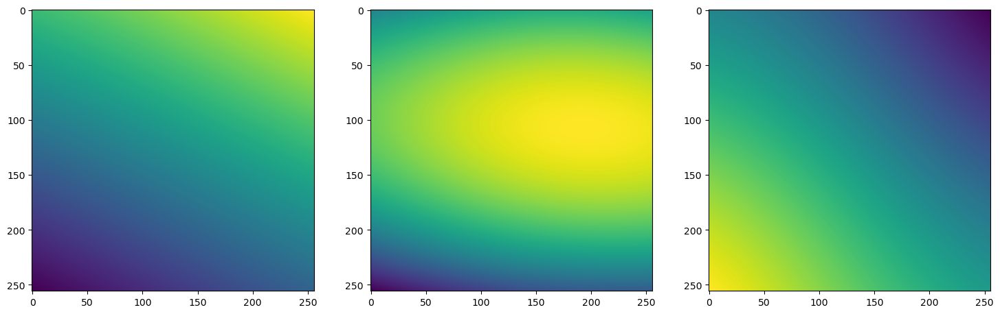

Step 160, Total loss 0.104568


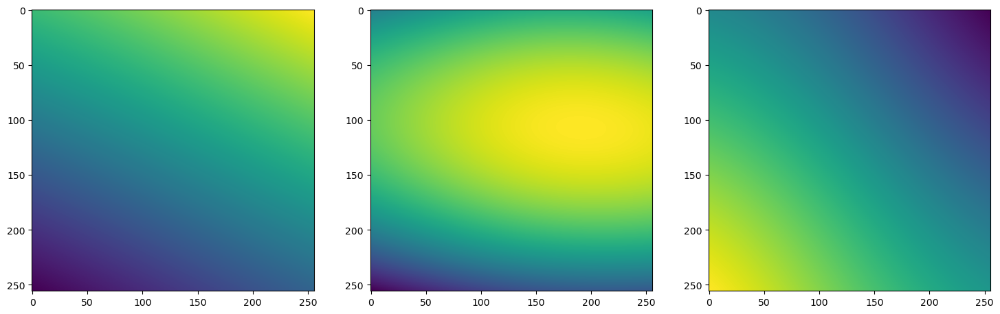

Step 170, Total loss 0.104561


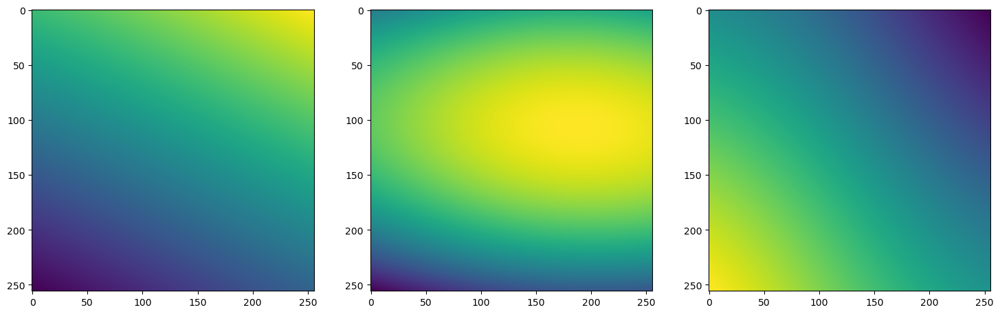

Step 180, Total loss 0.104554


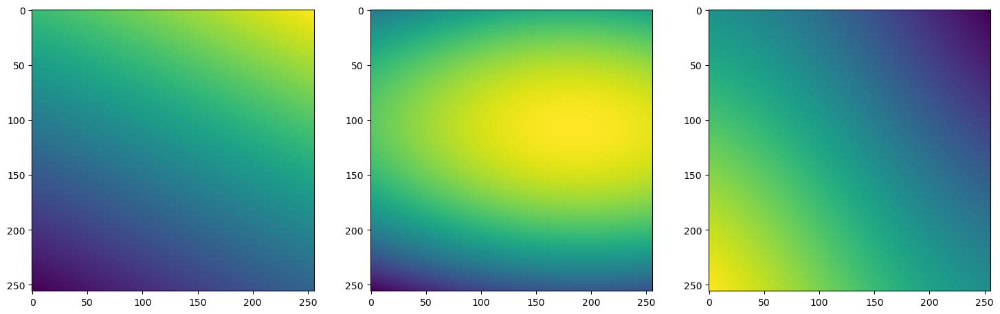

Step 190, Total loss 0.104546


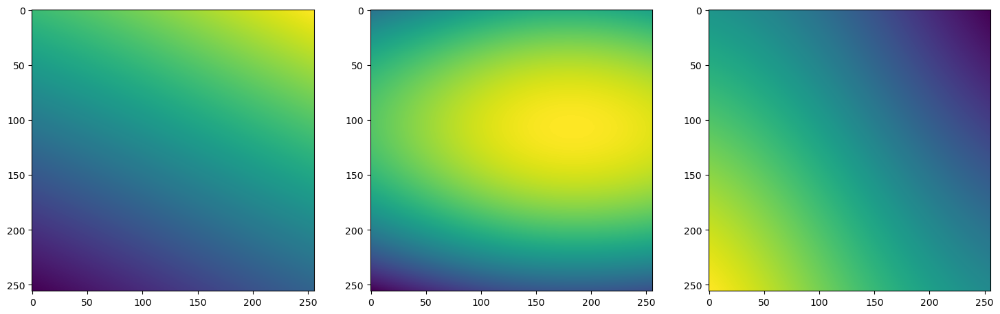

Step 200, Total loss 0.104537


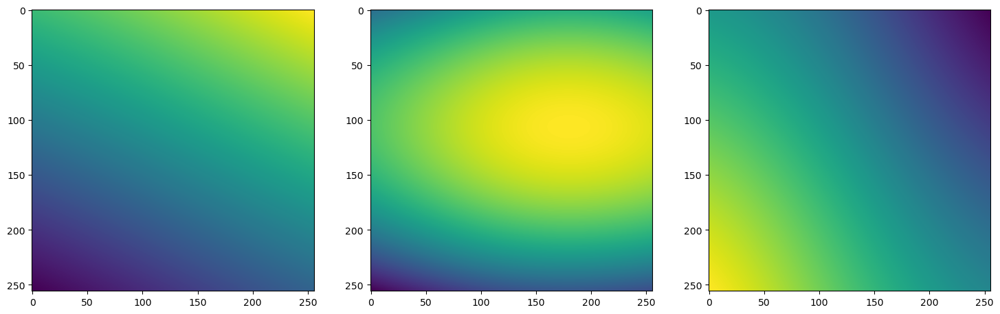

Step 210, Total loss 0.104528


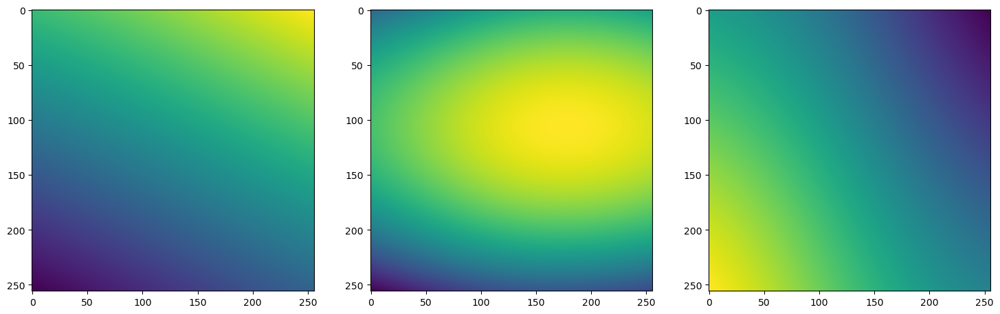

Step 220, Total loss 0.104518


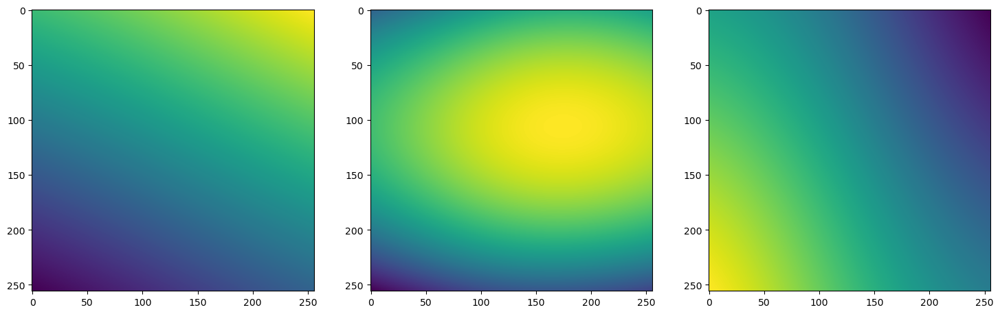

Step 230, Total loss 0.104507


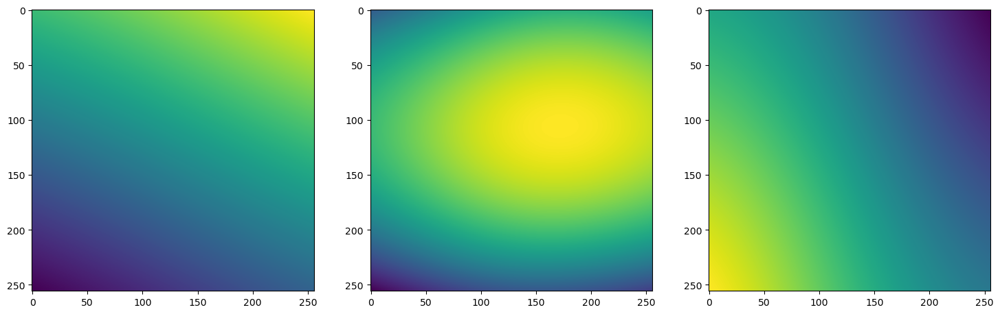

Step 240, Total loss 0.104494


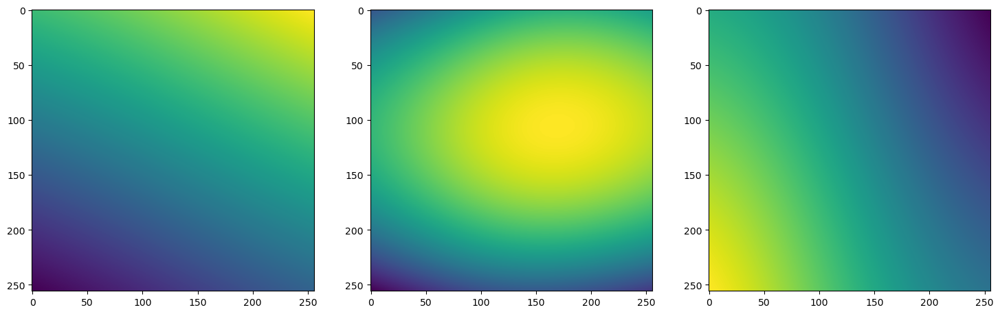

Step 250, Total loss 0.104481


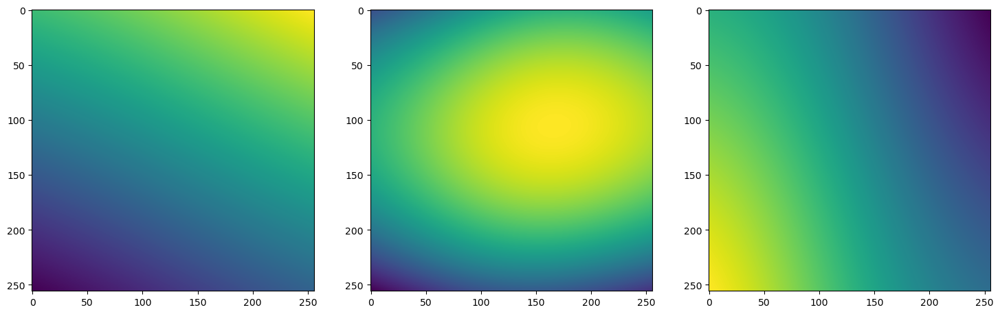

Step 260, Total loss 0.104466


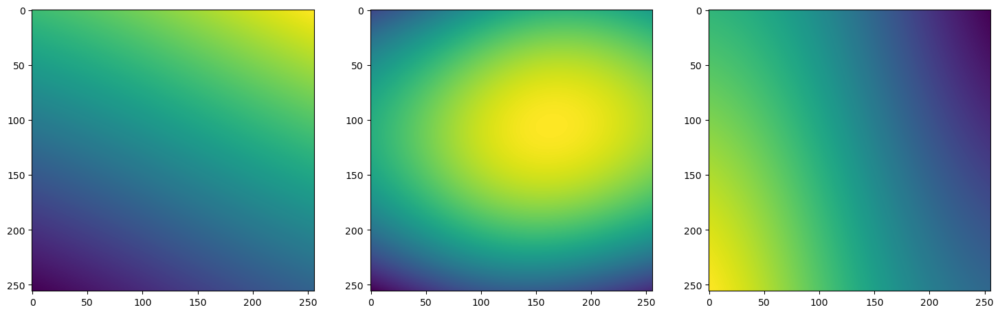

Step 270, Total loss 0.104449


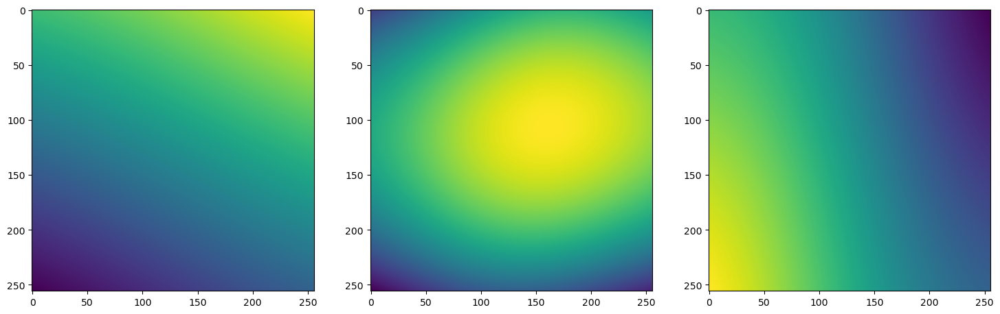

Step 280, Total loss 0.104429


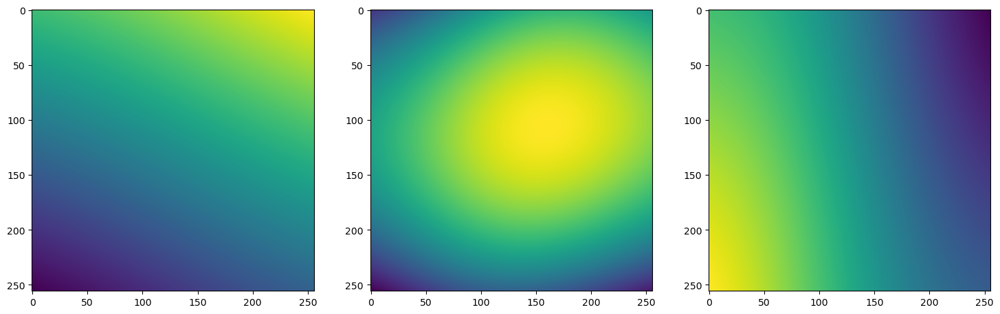

Step 290, Total loss 0.104407


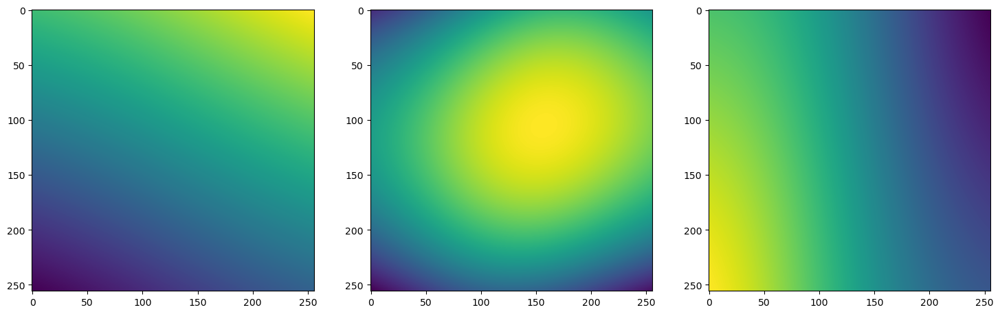

Step 300, Total loss 0.104381


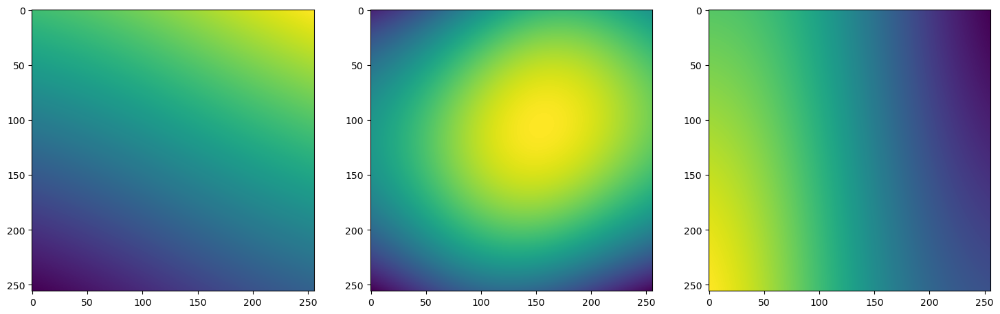

Step 310, Total loss 0.104350


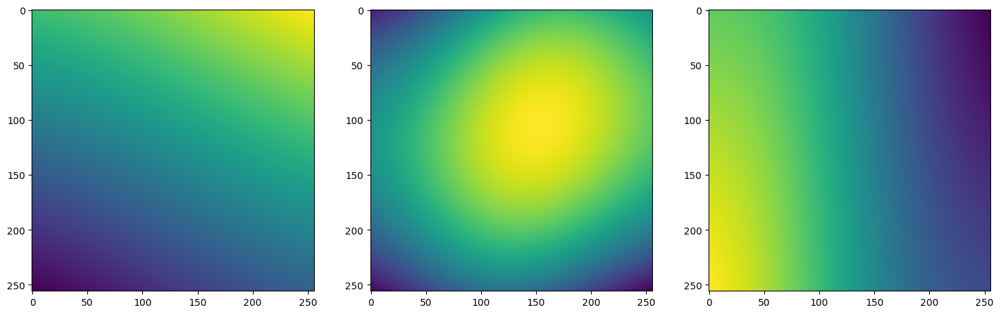

Step 320, Total loss 0.104315


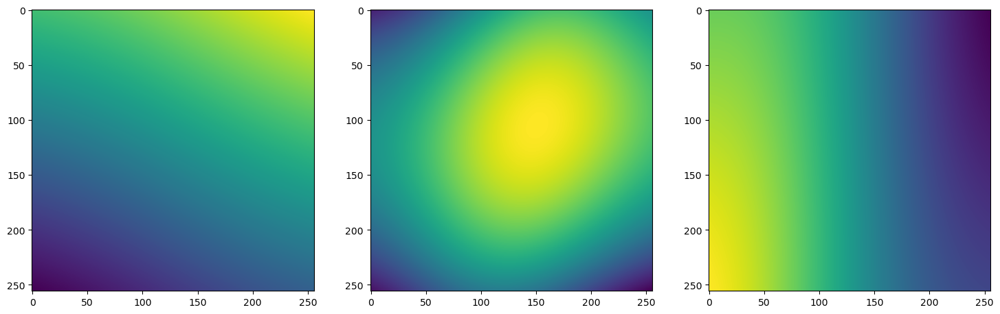

Step 330, Total loss 0.104273


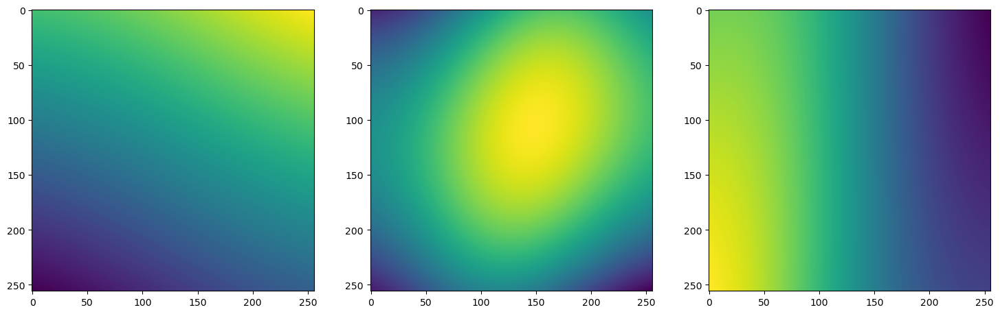

Step 340, Total loss 0.104223


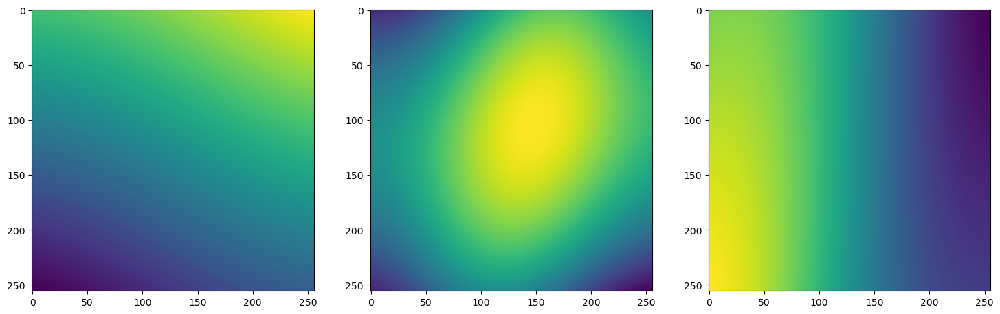

Step 350, Total loss 0.104163


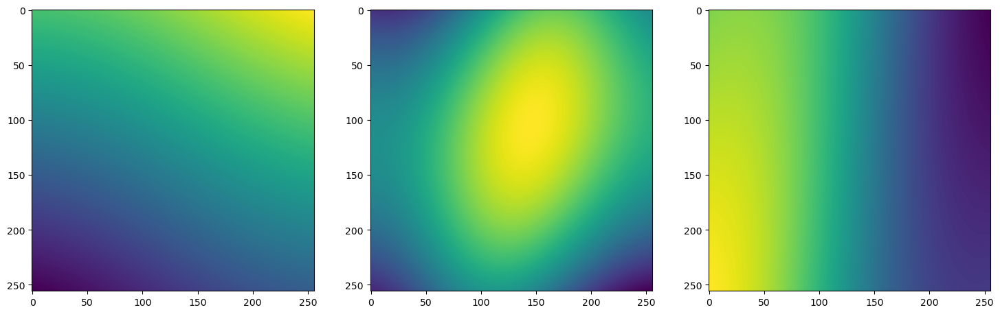

Step 360, Total loss 0.104093


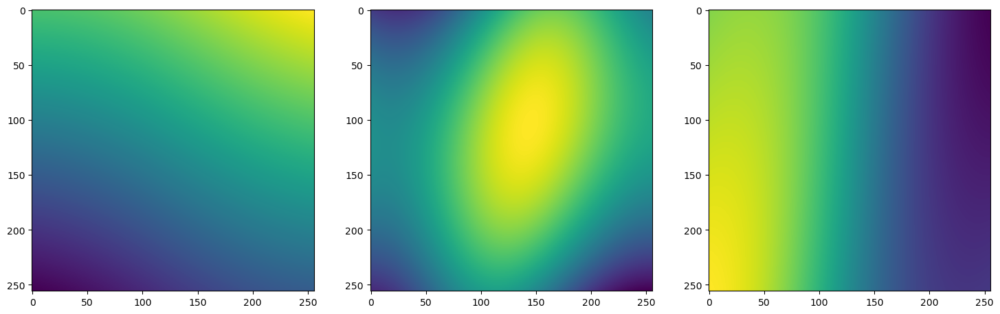

Step 370, Total loss 0.104011


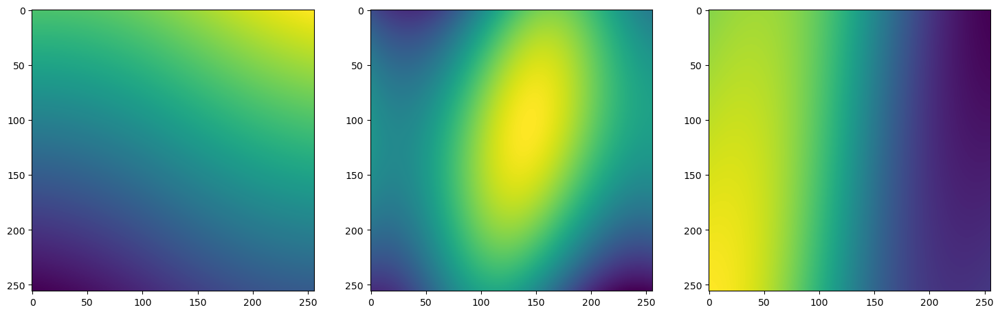

Step 380, Total loss 0.103918


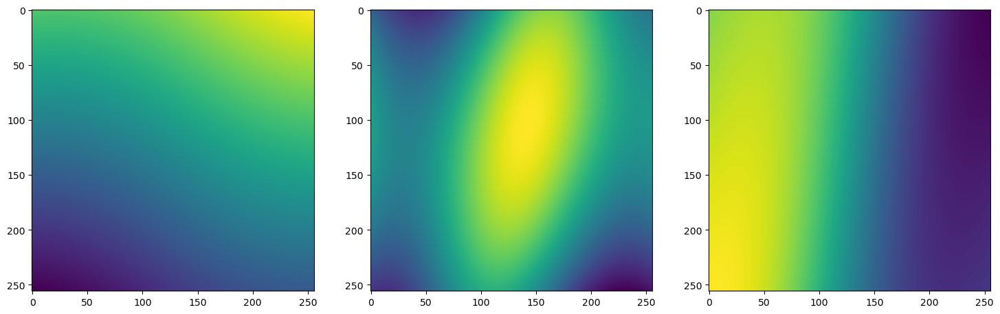

Step 390, Total loss 0.103813


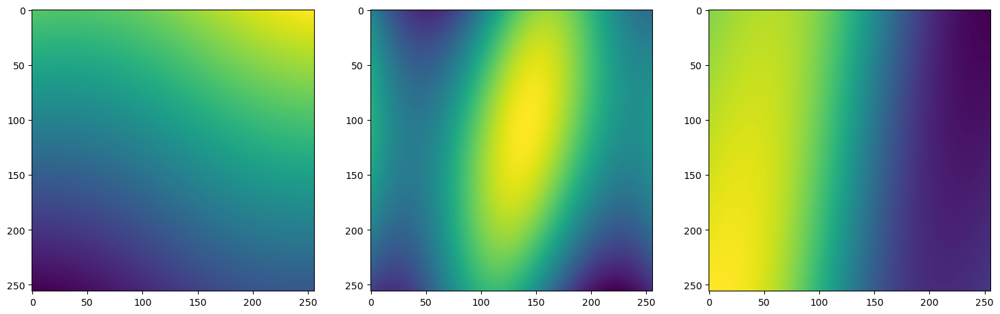

Step 400, Total loss 0.103701


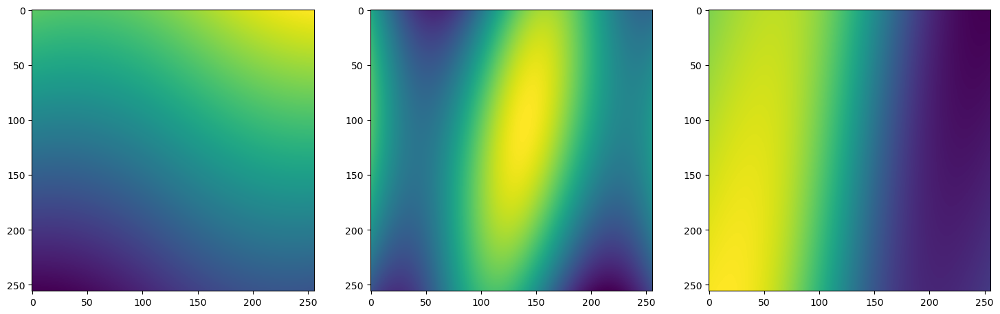

Step 410, Total loss 0.103586


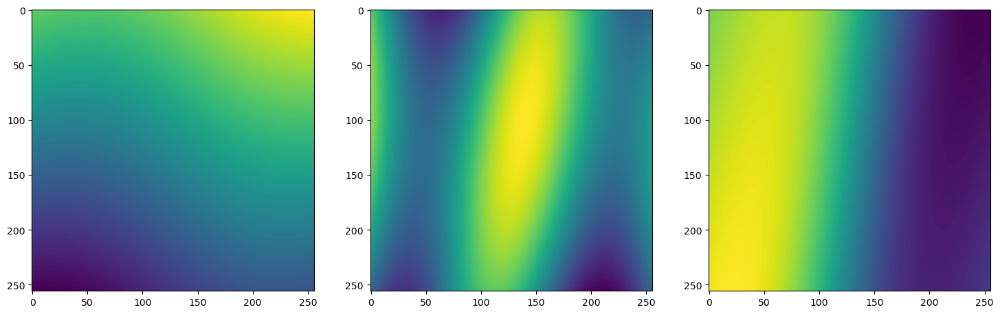

Step 420, Total loss 0.103475


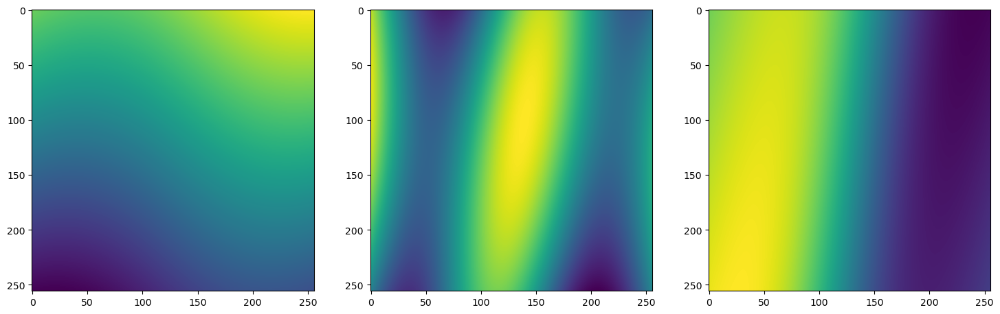

Step 430, Total loss 0.103374


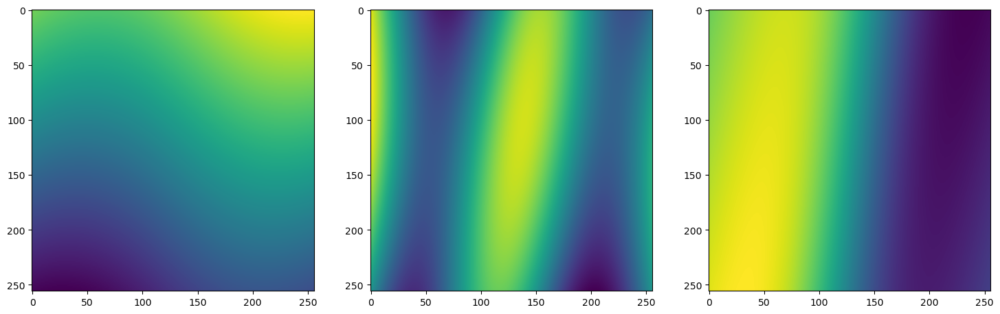

Step 440, Total loss 0.103289


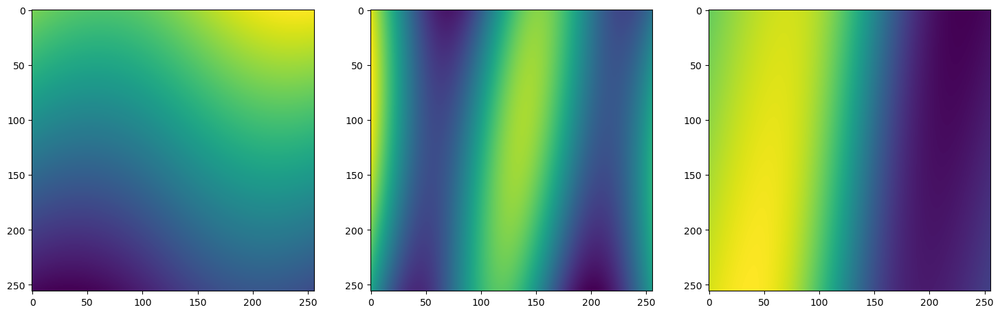

Step 450, Total loss 0.103220


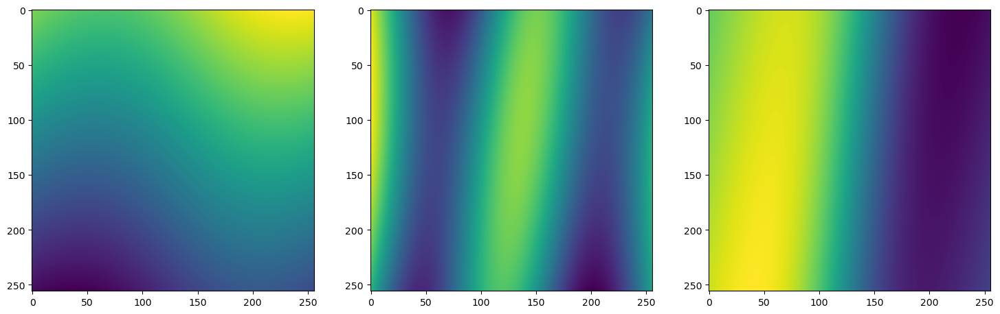

Step 460, Total loss 0.103163


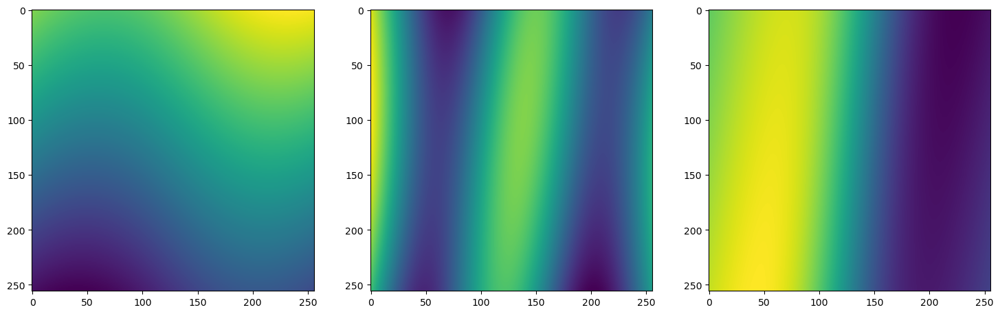

Step 470, Total loss 0.103113


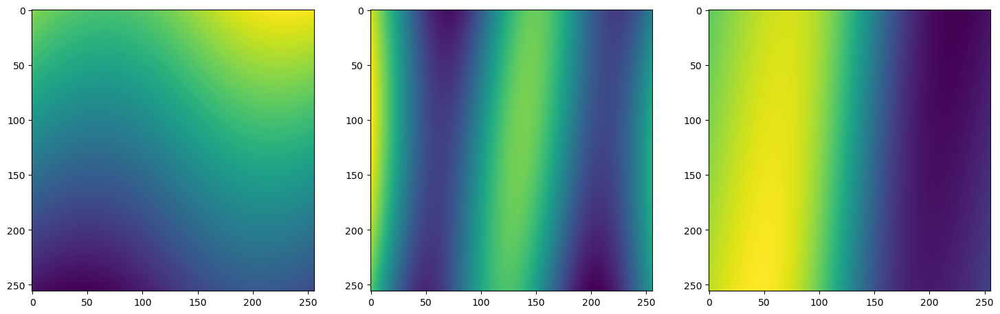

Step 480, Total loss 0.103066


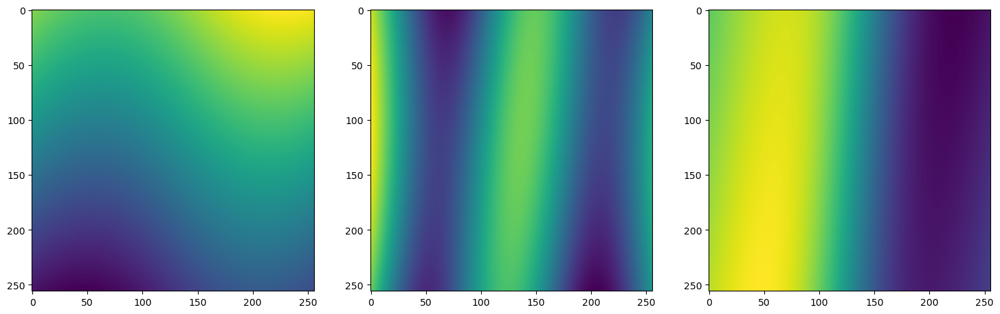

Step 490, Total loss 0.103019


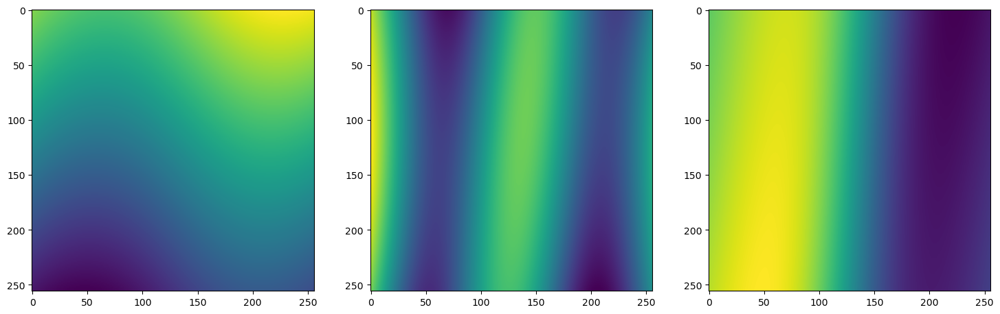

CPU times: user 20.1 s, sys: 296 ms, total: 20.4 s
Wall time: 19.8 s


In [17]:
%%time

total_steps = 500
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_tanh.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_tanh(model_input)
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()
